In [1]:
# Basic libraries
import re
import os
import gc
import warnings
import numpy as np
import pandas as pd

from wordcloud import WordCloud
import matplotlib.pyplot as plt

from gensim import corpora

warnings.filterwarnings("ignore")
import time

import sys
sys.path.append("..")
from measure_time import measure_time
%matplotlib inline

In [2]:
os.getcwd()

'D:\\Исследования и наука\\Вузы привлечение абитуриентов\\pyUNI_project'

In [3]:
# I am not sure if we need this to run bc I don't remember if it's used anywhere further
# Delete the cell?

# Import the class
from corpus_maker import CorpusMaker

Loading BokehJS ...

In [ ]:
# I am not sure if we need this to run bc I don't remember fi it's used anywhere further
# Delete the cell?

# Initialize the CorpusMaker class
corp_maker = CorpusMaker(input_folder = '../LDA_MSc_2_Preprocessing/Filtered Theses',
                         info_file = '../LDA_MSc_1_Webscraping/thesis_info.pkl')

In [ ]:
groups_files = os.listdir('Preprocessed')

# Initialize empty list
groups_words = []

prepr_groups_files = os.listdir('Preprocessed')

for group in prepr_groups_files:
    group_df = pd.read_csv(f'Preprocessed/{group}', index_col = "Unnamed: 0")
    group_words = " ".join(list(group_df['text_tokens'].dropna()))
    groups_words.append(group_words)

In [6]:
len(groups_words)

28

In [7]:
# Flatten into a list including all tokens
tokens_overall = [token for group_list in groups_words for token in group_list.split()]
len(tokens_overall)

5714359

In [8]:
tokens_overall[0]

'студент'

In [9]:
# Get the token distribution and drop out words mentioned less than three times
tokens_distribution = pd.Series(tokens_overall).value_counts()
tokens_distribution_wo_rare_words = tokens_distribution[tokens_distribution > 2]

groups_words_wo_rare_words = [[token for token in group_list.split() if token in tokens_distribution_wo_rare_words]
                              for group_list in groups_words]

print(f'\nAfter removing {sum(tokens_distribution) - sum(tokens_distribution_wo_rare_words)} rare words, \
total amount of words in the preprocessed texts decreased from {sum(tokens_distribution)} to {sum(tokens_distribution_wo_rare_words)}')  


After removing 74241 rare words, total amount of words in the preprocessed texts decreased from 5714359 to 5640118


In [10]:
dictionary = corpora.Dictionary(groups_words_wo_rare_words)
dictionary_token2id = dictionary.token2id

corpus = [dictionary.doc2bow(group_list) for group_list in groups_words_wo_rare_words]

In [11]:
#prints most frequent words per group in corpus
for i, group_file in enumerate(corpus):
    print(f"\nGroup {i+1}")
    sorted_group_file = sorted(group_file, key=lambda x: x[1], reverse=True)
    for id, freq in sorted_group_file[:5]:
        print(f"\n{dictionary[id]}: {freq}")
    print() 


Group 1

бонч: 44

пара: 43

препод: 41

студент: 36

дать: 33


Group 2

спбгута: 4467

студент: 3399

год: 3036

университет: 2405

санкт: 1978


Group 3

анон: 7309

спбгута: 4347

мочь: 4142

ребята: 3479

нибыть: 2897


Group 4

спбгута: 2693

абитуриент: 1856

бонч: 1830

обучение: 1377

поступать: 1367


Group 5

весь: 368

свой: 287

который: 285

мем: 278

наш: 276


Group 6

вшэ: 6845

вышка: 6102

год: 3852

студент: 3303

ниу: 3222


Group 7

весь: 9535

привет: 8331

мочь: 7489

который: 6616

ребята: 6257


Group 8

вшэ: 2508

факультет: 2192

программа: 2049

мочь: 1965

вышка: 1960


Group 9

помыткина: 172

конкурс: 157

гуап: 108

мем: 85

пичугин: 85


Group 10

гуап: 5381

студент: 2247

год: 1993

наш: 1673

который: 1441


Group 11

весь: 1392

ребята: 1172

мочь: 1067

который: 1050

девушка: 1039


Group 12

гуап: 670

студент: 217

который: 209

институт: 206

год: 203


Group 13

итмый: 188

конкурс: 138

анон: 88

ч: 85

студент: 83


Group 14

итмый: 11379


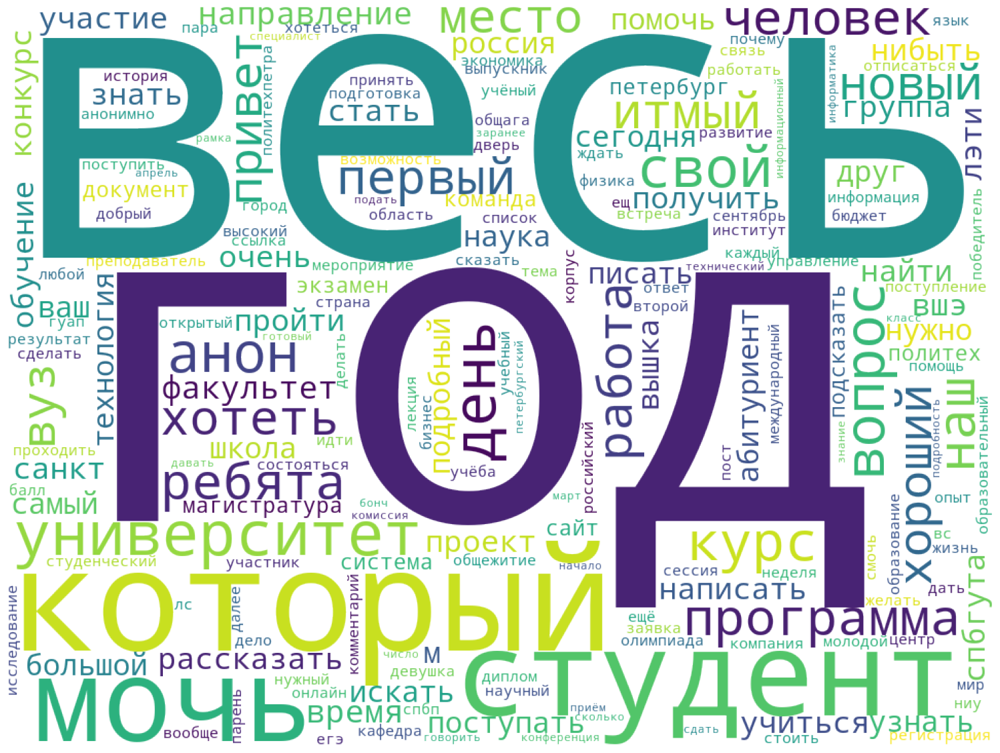

In [12]:
word_freq = {}
# Calculate word frequencies for theses in corpus and dictionary
for group in corpus:
    for id, frequency in group:
        word = dictionary[id]

        if word in word_freq:
            word_freq[word] += frequency
        else:
            word_freq[word] = frequency

wordcloud = WordCloud(width = 960, height = 720, background_color ="rgba(255, 255, 255, 0)", mode="RGBA", random_state = 66).generate_from_frequencies(word_freq)

plt.figure(figsize=(19.2, 14.4))
plt.imshow(wordcloud)
plt.axis('off')
#plt.savefig('MSc_Wordcloud.png', transparent = True, dpi = 300)
plt.show()
plt.close()

In [13]:
docs = [" ".join(group_tokens) for group_tokens in groups_words_wo_rare_words]

In [14]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(docs)

Loading BokehJS ...

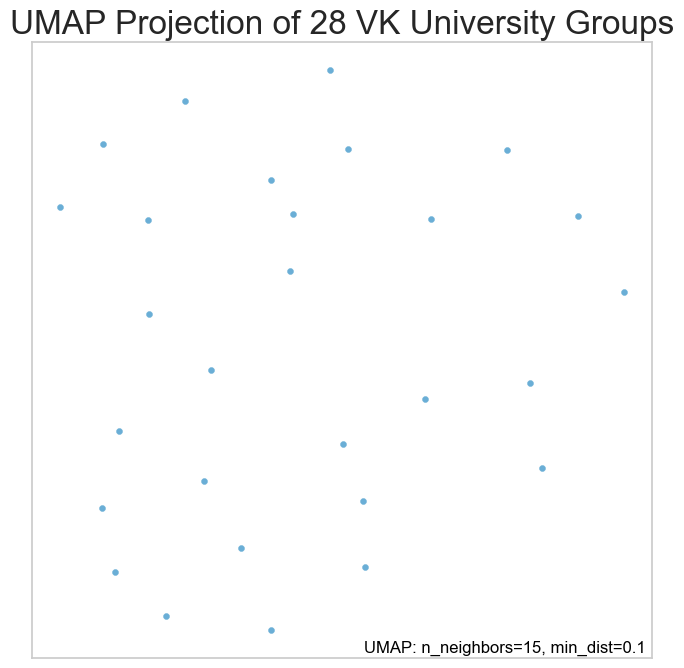

In [15]:
from yellowbrick.text import UMAPVisualizer
from umap.umap_ import UMAP
import umap.plot
#%matplotlib notebook
from bokeh.plotting import show, save, output_notebook, output_file, reset_output
from bokeh.resources import INLINE
output_notebook(resources=INLINE)

# Apply UMAP and plot results
mapper = UMAP(random_state=66).fit(tfidf_matrix)

f = umap.plot.points(mapper)
f.set_title('UMAP Projection of {} VK University Groups'.format(len(docs)), fontsize = 24)
#plt.savefig('UMAP theses.png', transparent = True, dpi = 300)
plt.show()
plt.close()

#fig2 = umap.plot.interactive(mapper, hover_data = thesis_info_pd[['Title', 'Author']], point_size=5)
#show(fig2)
#output_file("UMAP theses interactive.html")  # Set the output file path
#save(fig2)

In [16]:
import gensim
from gensim.models import CoherenceModel, LdaSeqModel 

# Set up LDA model
model = gensim.models.LdaModel(corpus = corpus,
                                   id2word = dictionary,
                                   num_topics = 12,
                                   random_state = 66,  # Custom random state used in our project
                                   update_every = 1,
                                   chunksize = 100,
                                   passes = 10,
                                   alpha = 0.5, 
                                   per_word_topics = True,
                                   eta = 0.5) 

In [17]:
 # Get coherence score
coh_model = CoherenceModel(model = model, texts = groups_words_wo_rare_words, corpus = corpus,
                           dictionary = dictionary, coherence = 'c_v')
coherence = coh_model.get_coherence()
        
# Get perplexity
perplexity = model.log_perplexity(corpus)
        
print(f'\nCoherence Score is: {coherence}')
print(f'\nPerplexity Score is: {perplexity}')
print('\nSee the topics:')
topics = model.print_topics()
for topic in topics:
    print(topic)


Coherence Score is: 0.3909018378250839

Perplexity Score is: -7.955705686946418

See the topics:
(0, '0.003*"год" + 0.002*"который" + 0.002*"университет" + 0.002*"хотеть" + 0.002*"студент" + 0.002*"мочь" + 0.002*"весь" + 0.001*"свой" + 0.001*"анон" + 0.001*"курс"')
(1, '0.002*"год" + 0.002*"который" + 0.002*"мочь" + 0.002*"вопрос" + 0.002*"хотеть" + 0.002*"студент" + 0.002*"весь" + 0.002*"курс" + 0.001*"ребята" + 0.001*"анон"')
(2, '0.016*"вшэ" + 0.014*"вышка" + 0.009*"год" + 0.007*"студент" + 0.007*"ниу" + 0.006*"школа" + 0.006*"свой" + 0.006*"который" + 0.006*"программа" + 0.005*"экономика"')
(3, '0.009*"документ" + 0.009*"балл" + 0.008*"абитуриент" + 0.008*"день" + 0.008*"факультет" + 0.008*"мочь" + 0.008*"вопрос" + 0.007*"год" + 0.006*"место" + 0.006*"программа"')
(4, '0.009*"сзгма" + 0.007*"весь" + 0.007*"наш" + 0.007*"студент" + 0.007*"мечников" + 0.006*"день" + 0.005*"свой" + 0.005*"который" + 0.005*"год" + 0.005*"профком"')
(5, '0.021*"лэти" + 0.011*"год" + 0.009*"студент" + 0

In [18]:
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

# Visualize using pyLDAvis
pyLDAvis.enable_notebook()
viz = gensimvis.prepare(model, corpus, dictionary)
viz

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
7     -0.007065 -0.140330       1        1  33.887194
8     -0.110100  0.060104       2        1  14.905904
9     -0.108389  0.035017       3        1   9.658199
3     -0.099618 -0.075635       4        1   9.359506
2     -0.087262  0.022201       5        1   9.345719
5     -0.081596  0.063288       6        1   8.194564
6     -0.066891  0.006504       7        1   7.193472
4     -0.014316 -0.006520       8        1   4.820599
10     0.111333 -0.077841       9        1   2.602007
11     0.175884  0.053635      10        1   0.032270
1      0.145208  0.022752      11        1   0.000283
0      0.142811  0.036826      12        1   0.000283, topic_info=            Term          Freq         Total Category  logprob  loglift
13335       анон  24085.000000  24085.000000  Default  30.0000  30.0000
5050       итмый  18349.000000  18349.000000  Default  29.0000  29.0000
232          год  38951.000000  38951.000000  Default  28.0000  28.0000
1091      привет  16486.000000  16486.000000  Default  27.0000  27.0000
668         мочь  32559.000000  32559.000000  Default  26.0000  26.0000
...          ...           ...           ...      ...      ...      ...
152       вопрос      0.016410  24107.603198  Topic12  -6.8812  -1.4261
1538   факультет      0.013391  15979.166361  Topic12  -7.0845  -1.2181
1177      работа      0.014005  17849.021293  Topic12  -7.0397  -1.2840
1562     хороший      0.013408  16261.726597  Topic12  -7.0832  -1.2344
1592     человек      0.013292  19212.811416  Topic12  -7.0920  -1.4099

[961 rows x 6 columns], token_table=       Topic      Freq        Term
term                              
0          1  0.077916  абитуриент
0          2  0.069248  абитуриент
0          3  0.298423  абитуриент
0          4  0.417201  абитуриент
0          5  0.058008  абитуриент
...      ...       ...         ...
31345      5  0.931684    ясинский
31345      6  0.010468    ясинский
31345      7  0.010468    ясинский
31345      8  0.010468    ясинский
31345      9  0.010468    ясинский

[5488 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 9, 10, 4, 3, 6, 7, 5, 11, 12, 2, 1])

In [19]:
def get_coherence_score(n, alpha, beta):
        
    '''
    Calculates the coherence score per model using gensim's CoherenceModel.
        
    Args:
        n: Number of topics in one LDA model (per iteration of search)
        alpha: Document-Topic Density
        beta: Topic-Word Density
            
    Returns:
        Coherence score, fitted LDA model.
        
    '''
        
    m = gensim.models.LdaModel(corpus = corpus,
                                id2word = dictionary,
                                num_topics = n,
                                random_state = 66,  # Custom random state used in our project
                                update_every = 1,
                                chunksize = 100,
                                passes = 10,
                                alpha = alpha, # Alpha grabbed from function arguments
                                per_word_topics = True,
                                eta = beta) # beta grabbed from function arguments
        
    cm = CoherenceModel(model = m,
                        texts = groups_words_wo_rare_words,
                        corpus = corpus,
                        dictionary = dictionary,
                        coherence = 'c_v')
        
    # Returns the variables defined above
    # This comes in handy when fitting the best model after grid search
    return cm.get_coherence(), m

In [20]:
def grid_search(n_topics, alphas, betas, verbose = False):
        
    '''
    Performs grid search, finding optimal LDA parameters
        
    Args:
        n_topics: list of possible topic number (can use list(range( ,)))
        alphas: list of alpha values (can use np.arange( , , ).tolist())
        betas: list of beta values (can use np.arange( , , ).tolist())
        verbose: If set to true, will give information about the number of topics, alpha and beta values and their coherence score per iteration

    Returns:
        self.scores: Coherence and perplexity scores for all LDA models tried out in grid search. 
    '''

    scores = []
    # Begin loop
    for n in n_topics:
        for alpha in alphas:
            for beta in betas:

                # Get coherence score and model
                coherence_score, model = get_coherence_score(n, alpha, beta)
                # Get perplexity score from model
                perplexity_score = model.log_perplexity(corpus)

                # Append into empty container for scores
                scores.append({'n_topics': n,
                                    'alpha': alpha,
                                    'beta': beta,
                                    'coherence_score': coherence_score,
                                    'perplexity_score': perplexity_score})

                # This gives a very long print output in case of large grid search
                # so it is only activated if verbose = True
                if verbose:
                    print(f'\nNumber of topics: {n}; alpha: {alpha}; beta: {beta}; Achieved coherence score: {coherence_score}')

    return pd.DataFrame(scores)

In [21]:
# Set up parameter grid 
n_topics = range(2,13)
alpha = ['symmetric']
beta = ['auto']

# Set begin time
st = time.time()

# Do the grid search
scores_df = grid_search(n_topics, alpha, beta, verbose = True)

# Setting verbose = True ensures the function output in detail 

# Measure execution time
measure_time(st)


Number of topics: 2; alpha: symmetric; beta: auto; Achieved coherence score: 0.3929050596108218

Number of topics: 3; alpha: symmetric; beta: auto; Achieved coherence score: 0.3534379889874026

Number of topics: 4; alpha: symmetric; beta: auto; Achieved coherence score: 0.3860337199705911

Number of topics: 5; alpha: symmetric; beta: auto; Achieved coherence score: 0.352092854573911

Number of topics: 6; alpha: symmetric; beta: auto; Achieved coherence score: 0.38385699691774827

Number of topics: 7; alpha: symmetric; beta: auto; Achieved coherence score: 0.41383573349888136

Number of topics: 8; alpha: symmetric; beta: auto; Achieved coherence score: 0.3665462884449018

Number of topics: 9; alpha: symmetric; beta: auto; Achieved coherence score: 0.38434735350321453

Number of topics: 10; alpha: symmetric; beta: auto; Achieved coherence score: 0.38193085555036965

Number of topics: 11; alpha: symmetric; beta: auto; Achieved coherence score: 0.42972601551213624

Number of topics: 12; a

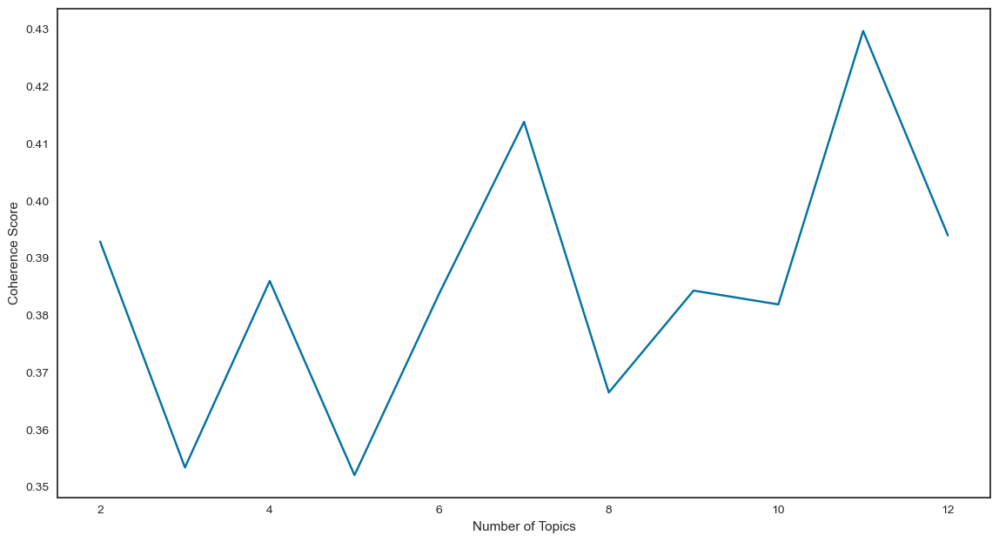

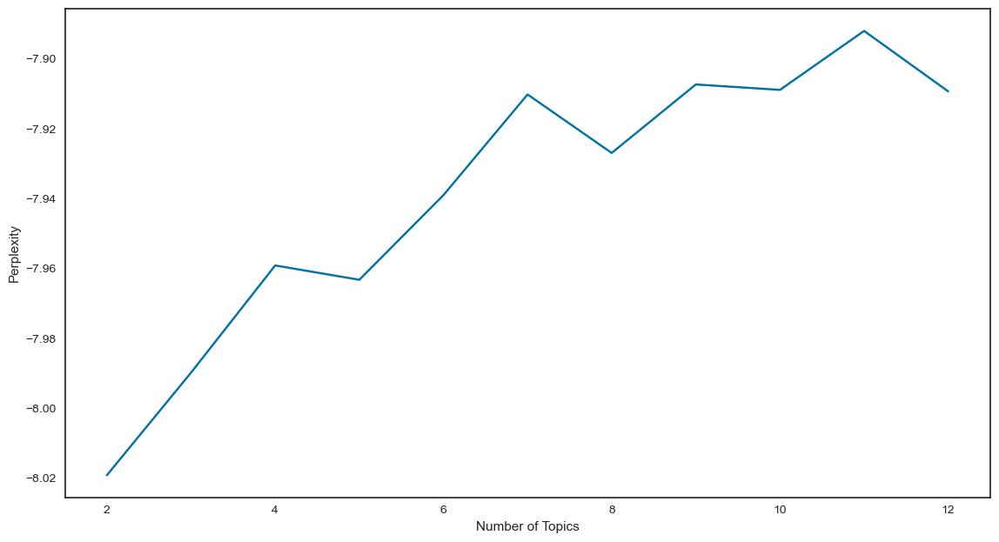

In [27]:
# Plot configuration 
plt.style.use('seaborn-v0_8-white')
plt.rcParams['figure.figsize'] = [12, 6.75]
plt.rcParams['font.size'] = 24

# Use list comprehension to extract the variables we need for plotting 
topics = scores_df['n_topics']#[n_topic['n_topics'] for n_topic in scores_df]
coherence_scores = scores_df['coherence_score']
perplexity_scores = scores_df['perplexity_score']
            
# Initialize subplots
fig1, ax1 = plt.subplots()
            
ax1.set_xlabel('Number of Topics')
ax1.set_ylabel('Coherence Score')
ax1.plot(topics, coherence_scores)
fig1.tight_layout()
#plt.savefig('1_Coherence_Scores.png', dpi = 300, transparent = True)
plt.show()
plt.close()
            
fig2, ax2 = plt.subplots()       
ax2.set_xlabel('Number of Topics')
ax2.set_ylabel('Perplexity')
ax2.plot(topics, perplexity_scores)
            
fig2.tight_layout()
#plt.savefig('2_Perplexity_Scores.png', dpi = 300, transparent = True)        
plt.show()
plt.close()

In [26]:
scores_df

,n_topics,alpha,beta,coherence_score,perplexity_score
0,2,symmetric,auto,0.392905,-8.019070
1,3,symmetric,auto,0.353438,-7.989719
2,4,symmetric,auto,0.386034,-7.959048
3,5,symmetric,auto,0.352093,-7.963149
4,6,symmetric,auto,0.383857,-7.938924
5,7,symmetric,auto,0.413836,-7.910112
6,8,symmetric,auto,0.366546,-7.926847
7,9,symmetric,auto,0.384347,-7.907249
8,10,symmetric,auto,0.381931,-7.908799
9,11,symmetric,auto,0.429726,-7.891925


In [28]:
# Set up the second stage parameter grid 

n_topics = [7]
alphas = np.arange(0.1, 1, 0.2).tolist()
betas = np.arange(0.1, 1, 0.2).tolist()

# Append symmetric and automatic alpha and beta values to the grid manually.
alphas.append('symmetric')
betas.append('auto')

# Set begin time
st = time.time()

# Do the grid search
scores_df2 = grid_search(n_topics, alphas, betas, verbose = True)

# Setting verbose = True ensures the function output in detail 

# Measure execution time
measure_time(st)


Number of topics: 7; alpha: 0.1; beta: 0.1; Achieved coherence score: 0.41208643098398784

Number of topics: 7; alpha: 0.1; beta: 0.30000000000000004; Achieved coherence score: 0.40742798382560924

Number of topics: 7; alpha: 0.1; beta: 0.5000000000000001; Achieved coherence score: 0.4096642167292594

Number of topics: 7; alpha: 0.1; beta: 0.7000000000000001; Achieved coherence score: 0.40491833444899744

Number of topics: 7; alpha: 0.1; beta: 0.9000000000000001; Achieved coherence score: 0.39734639781442155

Number of topics: 7; alpha: 0.1; beta: auto; Achieved coherence score: 0.41383573349888136

Number of topics: 7; alpha: 0.30000000000000004; beta: 0.1; Achieved coherence score: 0.41208643098398784

Number of topics: 7; alpha: 0.30000000000000004; beta: 0.30000000000000004; Achieved coherence score: 0.40742798382560924

Number of topics: 7; alpha: 0.30000000000000004; beta: 0.5000000000000001; Achieved coherence score: 0.4096642167292594

Number of topics: 7; alpha: 0.30000000000

C:\Users\baltt\anaconda3\lib\site-packages\seaborn\rcmod.py:82: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\Users\baltt\anaconda3\lib\site-packages\setuptools\_distutils\version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
C:\Users\baltt\anaconda3\lib\site-packages\seaborn\cm.py:1582: MatplotlibDeprecationWarning: The register_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps.register(name)`` instead.
  mpl_cm.register_cmap(_name, _cmap)
C:\Users\baltt\anaconda3\lib\site-packages\seaborn\cm.py:1583: MatplotlibDeprecationWarning: The register_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps.register(name)`` instead.
  mpl_cm.register_cmap(_name + "_r", _cmap_r)
C:\User

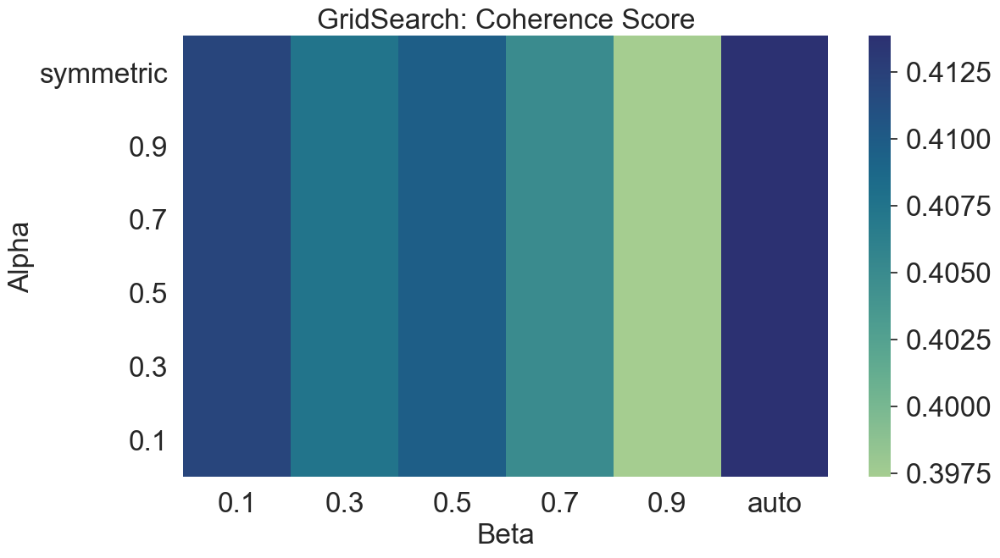

In [68]:
import seaborn as sns

#df = pd.read_csv('Topics_CSVs/scores_from_search.csv')
df = scores_df2.drop(['n_topics', 'perplexity_score'], axis = 1)
        
pivot_table = pd.pivot_table(df, index='alpha', columns='beta', values='coherence_score')
pivot_table.columns = [round(col, 1) if type(col)==float else col for col in pivot_table.columns]
pivot_table.index = [round(idx, 1) if type(idx)==float else idx for idx in pivot_table.index]
pivot_table = pivot_table.iloc[::-1]
        
# Set the figure size and font size
sns.set(rc={'figure.figsize': (12, 6.75)})
sns.set(font_scale=1.5)
# Set the seaborn style
sns.set(style="white")
        
fig, ax = plt.subplots()
sns.heatmap(pivot_table, ax=ax, cmap="crest")

ax.set_title('GridSearch: Coherence Score', fontdict={'fontsize': 24})
ax.set_xlabel('Beta', fontdict={'fontsize': 24})
ax.set_ylabel('Alpha', fontdict={'fontsize': 24})
ax.tick_params(axis='x', labelsize=24)  # Format x-axis tick labels
ax.tick_params(axis='y', labelsize=24, labelrotation=0)
cax = ax.figure.axes[-1]
cax.tick_params(labelsize=24) #format colorbar tick labels
        
plt.tight_layout()
plt.savefig('3_grid_search_2_heatmap.png', dpi=300, transparent=True)
plt.show()

C:\Users\baltt\anaconda3\lib\site-packages\seaborn\rcmod.py:402: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\Users\baltt\anaconda3\lib\site-packages\setuptools\_distutils\version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
C:\Users\baltt\anaconda3\lib\site-packages\seaborn\rcmod.py:402: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\Users\baltt\anaconda3\lib\site-packages\setuptools\_distutils\version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
C:\Users\baltt\anaconda3\lib\site-packages\seaborn\rcmod.py:402: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__vers

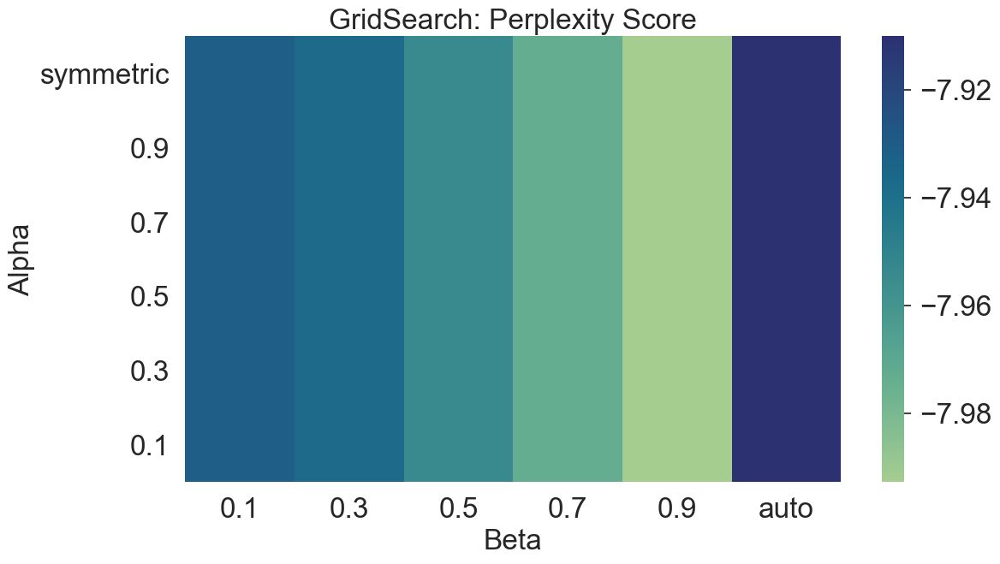

In [69]:
import seaborn as sns

#df = pd.read_csv('Topics_CSVs/scores_from_search.csv')
df = scores_df2.drop(['n_topics', 'coherence_score'], axis = 1)
        
pivot_table = pd.pivot_table(df, index='alpha', columns='beta', values='perplexity_score')
pivot_table.columns = [round(col, 1) if type(col)==float else col for col in pivot_table.columns]
pivot_table.index = [round(idx, 1) if type(idx)==float else idx for idx in pivot_table.index]
pivot_table = pivot_table.iloc[::-1]
        
# Set the figure size and font size
sns.set(rc={'figure.figsize': (12, 6.75)})
sns.set(font_scale=1.5)
# Set the seaborn style
sns.set(style="white")
        
fig, ax = plt.subplots()
sns.heatmap(pivot_table, ax=ax, cmap="crest")

ax.set_title('GridSearch: Perplexity Score', fontdict={'fontsize': 24})
ax.set_xlabel('Beta', fontdict={'fontsize': 24})
ax.set_ylabel('Alpha', fontdict={'fontsize': 24})
ax.tick_params(axis='x', labelsize=24)  # Format x-axis tick labels
ax.tick_params(axis='y', labelsize=24, labelrotation=0)
cax = ax.figure.axes[-1]
cax.tick_params(labelsize=24) #format colorbar tick labels
        
plt.tight_layout()
plt.savefig('3_grid_search_2_heatmap_perplexity.png', dpi=300, transparent=True)
plt.show()

In [70]:
# Set up best LDA model
best_model = gensim.models.LdaModel(corpus = corpus,
                                   id2word = dictionary,
                                   num_topics = 7,
                                   random_state = 66,  # Custom random state used in our project
                                   update_every = 1,
                                   chunksize = 100,
                                   passes = 10,
                                   alpha = 0.5, 
                                   per_word_topics = True,
                                   eta = 0.5) 

print('\nSee the topics:')
best_topics = best_model.print_topics()
for topic in best_topics:
    print(topic)


See the topics:
(0, '0.036*"итмый" + 0.019*"университет" + 0.008*"год" + 0.006*"который" + 0.005*"весь" + 0.005*"студент" + 0.005*"новый" + 0.005*"свой" + 0.004*"наш" + 0.004*"первый"')
(1, '0.015*"анон" + 0.010*"мочь" + 0.008*"весь" + 0.008*"ребята" + 0.007*"нибыть" + 0.007*"курс" + 0.006*"найти" + 0.006*"который" + 0.005*"хотеть" + 0.005*"спбгута"')
(2, '0.012*"вшэ" + 0.011*"вышка" + 0.008*"год" + 0.007*"студент" + 0.006*"свой" + 0.006*"который" + 0.006*"ниу" + 0.005*"школа" + 0.005*"новый" + 0.005*"весь"')
(3, '0.009*"абитуриент" + 0.009*"документ" + 0.008*"балл" + 0.008*"день" + 0.008*"мочь" + 0.008*"факультет" + 0.008*"вопрос" + 0.007*"год" + 0.006*"поступление" + 0.006*"место"')
(4, '0.011*"весь" + 0.009*"привет" + 0.009*"мочь" + 0.008*"анон" + 0.007*"который" + 0.007*"ребята" + 0.007*"хотеть" + 0.007*"курс" + 0.007*"вопрос" + 0.006*"человек"')
(5, '0.011*"лэти" + 0.010*"год" + 0.009*"студент" + 0.007*"гуап" + 0.006*"университет" + 0.006*"который" + 0.006*"наш" + 0.006*"день" + 

In [71]:
# Visualize the best model using pyLDAvis
pyLDAvis.enable_notebook()
viz = gensimvis.prepare(best_model, corpus, dictionary)
viz

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.105989 -0.001144       1        1  23.475945
6     -0.101100  0.005905       2        1  18.035544
1      0.128239 -0.043539       3        1  16.069285
5     -0.089650 -0.030797       4        1  15.214016
3      0.026973  0.101879       5        1  10.625808
2     -0.044425  0.002612       6        1  10.186483
0     -0.026026 -0.034918       7        1   6.392919, topic_info=              Term          Freq         Total Category  logprob  loglift
5050         итмый  20169.000000  20169.000000  Default  30.0000  30.0000
13335         анон  24528.000000  24528.000000  Default  29.0000  29.0000
1508   университет  31250.000000  31250.000000  Default  28.0000  28.0000
3134           вшэ  13035.000000  13035.000000  Default  27.0000  27.0000
6145          лэти  11695.000000  11695.000000  Default  26.0000  26.0000
...            ...           ...           ...      ...      ...      ...
1129     программа   1120.172241  20394.183651   Topic7  -5.7742  -0.1518
668           мочь   1324.169003  33106.683530   Topic7  -5.6069  -0.4690
1592       человек   1018.411904  19446.354880   Topic7  -5.8694  -0.1994
1207    рассказать    900.297430  14426.571229   Topic7  -5.9927  -0.0241
152         вопрос    928.265393  24456.403065   Topic7  -5.9621  -0.5214

[630 rows x 6 columns], token_table=       Topic      Freq        Term
term                              
0          1  0.079961  абитуриент
0          2  0.251750  абитуриент
0          3  0.025147  абитуриент
0          4  0.049917  абитуриент
0          5  0.520360  абитуриент
...      ...       ...         ...
31345      3  0.011118    ясинский
31345      4  0.011118    ясинский
31345      5  0.011118    ясинский
31345      6  0.945050    ясинский
31345      7  0.011118    ясинский

[3279 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 7, 2, 6, 4, 3, 1])

In [72]:
topics_names = [
    "General Information about ITMO",
    "Overheard: Discussions and Questions", #подслушано
    "Information about HSE",
    "Information for Prospect Applicants",
    "Overheard: Discussions and Questions about Student Life",
    "General Information about LETI and GUAP",
    "General Information about SPbPU and SPbSUT"
]

In [74]:
theta, _ = best_model.inference(corpus)
theta = pd.DataFrame(theta)
theta

,0,1,2,3,4,5,6
0,28.527262,3324.069336,280.119141,11.725243,170.102051,16.233986,112.145332
1,0.782524,0.728233,29.971245,2.417321,0.732982,9569.666992,290327.875000
2,0.901756,332063.562500,1.010830,1.300574,133.577942,0.987198,2.703930
3,0.696587,0.712340,0.742344,38247.937500,0.689634,1.252646,99495.335938
4,22.157900,792.107605,15609.338867,0.981938,27817.564453,1.904111,0.844655
5,21.833939,0.768083,426690.250000,1049.620239,6.398390,419.049683,1357.644165
6,5.321111,489.217896,6272.776855,4915.568359,815488.562500,17.939587,14.885688
7,1.002566,2.916145,19949.076172,214307.312500,2008.892700,2.668217,6.190479
8,3.287646,3281.163818,3786.522461,0.807729,477.086761,683.407959,0.825539
9,107.157387,21.431454,835.266052,1506.447266,132.737488,216297.562500,6532.989746


In [82]:
groups_names = pd.read_excel("Groups info.xlsx")
groups_names["Group Name"] = groups_names["University"] + " " + groups_names["Group Type"]
groups_names

,File Number,University,Group Type,Group Name
0,1,СПбГУТ,Мемы,СПбГУТ Мемы
1,2,СПбГУТ,Основная,СПбГУТ Основная
2,3,СПбГУТ,Подслушано,СПбГУТ Подслушано
3,4,СПбГУТ,Поступление,СПбГУТ Поступление
4,5,НИУ ВШЭ,Мемы,НИУ ВШЭ Мемы
5,6,НИУ ВШЭ,Основная,НИУ ВШЭ Основная
6,7,НИУ ВШЭ,Подслушано,НИУ ВШЭ Подслушано
7,8,НИУ ВШЭ,Поступление,НИУ ВШЭ Поступление
8,9,ГУАП,Мемы,ГУАП Мемы
9,10,ГУАП,Основная,ГУАП Основная


In [85]:
dominant_topic_doc = theta.idxmax(axis=1) + 1

len_docs = len(dominant_topic_doc)

groups_names['Topic']  = dominant_topic_doc
groups_names

,File Number,University,Group Type,Group Name,Topic
0,1,СПбГУТ,Мемы,СПбГУТ Мемы,2
1,2,СПбГУТ,Основная,СПбГУТ Основная,7
2,3,СПбГУТ,Подслушано,СПбГУТ Подслушано,2
3,4,СПбГУТ,Поступление,СПбГУТ Поступление,7
4,5,НИУ ВШЭ,Мемы,НИУ ВШЭ Мемы,5
5,6,НИУ ВШЭ,Основная,НИУ ВШЭ Основная,3
6,7,НИУ ВШЭ,Подслушано,НИУ ВШЭ Подслушано,5
7,8,НИУ ВШЭ,Поступление,НИУ ВШЭ Поступление,4
8,9,ГУАП,Мемы,ГУАП Мемы,3
9,10,ГУАП,Основная,ГУАП Основная,6


In [89]:
topic_mapping = {i + 1: topic_title for i, topic_title in enumerate(topics_names)}

groups_names['Topic Title'] = groups_names['Topic'].map(topic_mapping)
groups_names['Topic Title numbered'] = groups_names.apply(lambda row: f"{row['Topic']:01d}: {row['Topic Title']}", axis=1)
groups_names

,File Number,University,Group Type,Group Name,Topic,Topic Title,Topic Title numbered
0,1,СПбГУТ,Мемы,СПбГУТ Мемы,2,Overheard: Discussions and Questions,2: Overheard: Discussions and Questions
1,2,СПбГУТ,Основная,СПбГУТ Основная,7,General Information about SPbPU and SPbSUT,7: General Information about SPbPU and SPbSUT
2,3,СПбГУТ,Подслушано,СПбГУТ Подслушано,2,Overheard: Discussions and Questions,2: Overheard: Discussions and Questions
3,4,СПбГУТ,Поступление,СПбГУТ Поступление,7,General Information about SPbPU and SPbSUT,7: General Information about SPbPU and SPbSUT
4,5,НИУ ВШЭ,Мемы,НИУ ВШЭ Мемы,5,Overheard: Discussions and Questions about Stu...,5: Overheard: Discussions and Questions about ...
5,6,НИУ ВШЭ,Основная,НИУ ВШЭ Основная,3,Information about HSE,3: Information about HSE
6,7,НИУ ВШЭ,Подслушано,НИУ ВШЭ Подслушано,5,Overheard: Discussions and Questions about Stu...,5: Overheard: Discussions and Questions about ...
7,8,НИУ ВШЭ,Поступление,НИУ ВШЭ Поступление,4,Information for Prospect Applicants,4: Information for Prospect Applicants
8,9,ГУАП,Мемы,ГУАП Мемы,3,Information about HSE,3: Information about HSE
9,10,ГУАП,Основная,ГУАП Основная,6,General Information about LETI and GUAP,6: General Information about LETI and GUAP


Text(0.5, 1.0, 'UMAP: 28 MSc Theses Colored by Topics')

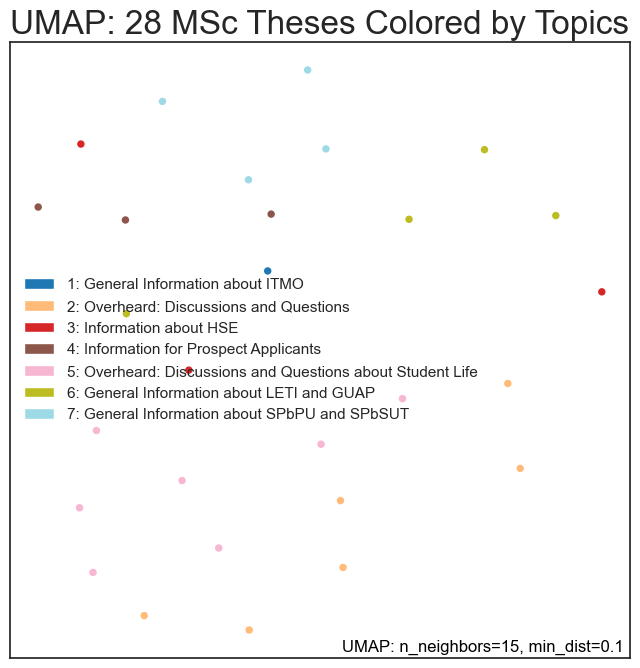

In [90]:
f = umap.plot.points(mapper, labels=groups_names['Topic Title numbered'], theme = 'blue')
f.set_title('UMAP: {} MSc Theses Colored by Topics'.format(len_docs), fontsize = 24)

In [91]:
fig2 = umap.plot.interactive(mapper, hover_data = groups_names[['University', 'Group Type', 'Topic', 'Topic Title']], 
                                     labels=groups_names['Topic Title numbered'],
                                     point_size=9,  theme='blue')
show(fig2)

C:\Users\baltt\anaconda3\lib\site-packages\bokeh\io\notebook.py:487: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


C:\Users\baltt\anaconda3\lib\site-packages\bokeh\io\notebook.py:487: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)
